# Turf Detection — UNet + MobileSAM Combined (single notebook)

One self-contained pipeline, run top to bottom:
1. Train UNet (positive-focused: weighted loss + oversampling) for turf detection
2. Fine-tune MobileSAM's mask decoder for clean boundaries
3. Combine: UNet finds *where* turf is → MobileSAM refines *how it's shaped*
4. Polygon smoothing + final results

**Edit the config cell below with your dataset path before running.**

In [1]:
# ===== CONFIG — edit these =====
import os

DATASET_ROOT = "/kaggle/input/datasets/asadahmad18/375-v1/375v1"   # <-- change to your actual path
TRAIN_IMG_DIR = os.path.join(DATASET_ROOT, "train", "images")
TRAIN_MASK_DIR = os.path.join(DATASET_ROOT, "train", "masks")
VAL_IMG_DIR = os.path.join(DATASET_ROOT, "val", "images")
VAL_MASK_DIR = os.path.join(DATASET_ROOT, "val", "masks")
IMG_EXT = "*.png"   # change if your files use a different extension

BASE_DIR = "./turf_project_combined"
UNET_SAVE_PATH = os.path.join(BASE_DIR, "best_turf_unet.pth")
SAM_CHECKPOINT_BASE = os.path.join(BASE_DIR, "mobile_sam.pt")
SAM_DECODER_SAVE_PATH = os.path.join(BASE_DIR, "best_mask_decoder.pth")
RESULTS_DIR = os.path.join(BASE_DIR, "results")
os.makedirs(RESULTS_DIR, exist_ok=True)

UNET_IMG_SIZE = 512
SAM_IMG_SIZE = 1024

import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
if device.type == "cpu":
    print("WARNING: training UNet + fine-tuning SAM on CPU will be very slow. GPU strongly recommended.")

Using device: cuda


In [2]:
!pip install -q segmentation-models-pytorch albumentations opencv-python-headless scipy
!pip install -q git+https://github.com/ChaoningZhang/MobileSAM.git
!test -f {SAM_CHECKPOINT_BASE} || wget -q -O {SAM_CHECKPOINT_BASE} https://github.com/ChaoningZhang/MobileSAM/raw/master/weights/mobile_sam.pt
!ls -lh {SAM_CHECKPOINT_BASE}

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 4.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
-rw-r--r-- 1 root root 39M Sep  7 12:49 ./turf_project_combined/mobile_sam.pt


In [3]:
print("DATASET_ROOT:", DATASET_ROOT)
print("Exists:", os.path.exists(DATASET_ROOT))
if os.path.exists(DATASET_ROOT):
    print("Contents:", os.listdir(DATASET_ROOT))

print("\nTRAIN_IMG_DIR:", TRAIN_IMG_DIR)
print("Exists:", os.path.exists(TRAIN_IMG_DIR))
if os.path.exists(TRAIN_IMG_DIR):
    print("Sample files:", os.listdir(TRAIN_IMG_DIR)[:5])

DATASET_ROOT: /kaggle/input/datasets/asadahmad18/375-v1/375v1
Exists: True
Contents: ['val', 'train']

TRAIN_IMG_DIR: /kaggle/input/datasets/asadahmad18/375-v1/375v1/train/images
Exists: True
Sample files: ['406_train_C1_X1536_Y2560.png', '2296_train_C1_X768_Y512.png', '533_train_C1_X2816_Y3328.png', '542_train_C1_X1280_Y1280.png', '1250_train_C1_X2816_Y1792.png']


In [4]:
import os
for root, dirs, files in os.walk("/kaggle/input"):
    level = root.replace("/kaggle/input", "").count(os.sep)
    indent = "  " * level
    print(f"{indent}{os.path.basename(root)}/")
    if level < 3:
        for f in files[:3]:
            print(f"{indent}  {f}")

input/
  datasets/
    asadahmad18/
      375-v1/
        375v1/
          val/
            images/
            masks/
          train/
            images/
            masks/


In [5]:
import glob, random, cv2
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import albumentations as A
import segmentation_models_pytorch as smp
from segmentation_models_pytorch.losses import SoftBCEWithLogitsLoss, DiceLoss
from torch.cuda.amp import autocast, GradScaler
import torch.nn.functional as F
from scipy.interpolate import splprep, splev
from mobile_sam import sam_model_registry

train_img_paths = sorted(glob.glob(os.path.join(TRAIN_IMG_DIR, IMG_EXT)))
val_img_paths = sorted(glob.glob(os.path.join(VAL_IMG_DIR, IMG_EXT)))
print(f"Train images: {len(train_img_paths)} | Val images: {len(val_img_paths)}")

if len(train_img_paths) == 0 or len(val_img_paths) == 0:
    raise RuntimeError("No images found — check DATASET_ROOT / IMG_EXT in the config cell.")

Train images: 25962 | Val images: 6145


/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/usr/local/lib/python3.12/dist-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
/usr/local/lib/python3.12/dist-packages/mobile_sam/modeling/tiny_vit_sam.py:656: UserWarning: Overwriting tiny_vit_5m_224 in registry with mobile_sam.modeling.tiny_vit_sam.tiny_vit_5m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/usr/local/lib/python3.12/dist-packages/mobile_sam/modeling/tiny_vit_sam.py:656: UserWarning: Overwriting tiny_vit_11m

## Sanity check — mask polarity + positive pixel ratio

Confirms turf pixels are the bright (255) value in the masks before training
on them — an inverted mask would produce exactly the "learns background
instead of turf" symptom.

Mean turf pixel ratio: 0.11397663116455078
%% tiles with <1%% turf: 0.34


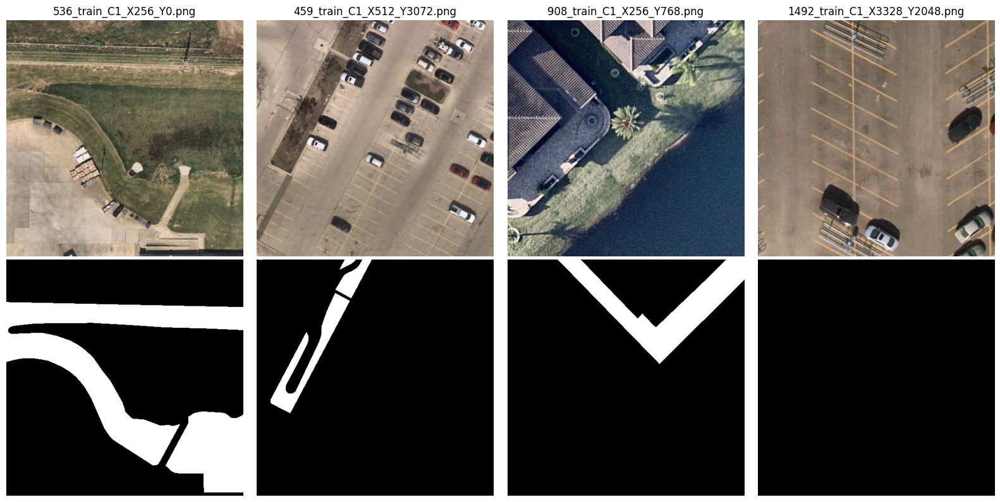

Computed pos_weight for BCE: 7.773728349246225


In [6]:
sample_mask_paths = random.sample(glob.glob(os.path.join(TRAIN_MASK_DIR, IMG_EXT)), min(300, len(train_img_paths)))
pos_ratios = np.array([(cv2.imread(p, cv2.IMREAD_GRAYSCALE) > 127).mean() for p in sample_mask_paths])
print("Mean turf pixel ratio:", pos_ratios.mean())
print("%% tiles with <1%% turf:", (pos_ratios < 0.01).mean())

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
for i, p in enumerate(random.sample(train_img_paths, 4)):
    fname = os.path.basename(p)
    img = cv2.imread(p)[:, :, ::-1]
    mask = cv2.imread(os.path.join(TRAIN_MASK_DIR, fname), cv2.IMREAD_GRAYSCALE)
    axes[0, i].imshow(img); axes[0, i].set_title(fname); axes[0, i].axis("off")
    axes[1, i].imshow(mask, cmap="gray"); axes[1, i].axis("off")
plt.tight_layout(); plt.show()

pos_weight_value = float((1 - pos_ratios.mean()) / pos_ratios.mean())
print("Computed pos_weight for BCE:", pos_weight_value)

# PART 1 — Train UNet (positive-focused)

Weighted BCE + Tversky loss (penalizes missed turf harder than false
positives) plus oversampling of turf-containing tiles.

In [7]:
train_transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=0.6),
    A.HueSaturationValue(hue_shift_limit=15, sat_shift_limit=25, val_shift_limit=15, p=0.5),
    A.RandomResizedCrop(size=(UNET_IMG_SIZE, UNET_IMG_SIZE), scale=(0.7, 1.0), p=0.5),
    A.GaussNoise(p=0.2),
])

class TurfDataset(Dataset):
    def __init__(self, img_paths, mask_dir, size=UNET_IMG_SIZE, augment=False):
        self.img_paths = img_paths
        self.mask_dir = mask_dir
        self.size = size
        self.augment = augment

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        fname = os.path.basename(img_path)
        img = cv2.imread(img_path, cv2.IMREAD_COLOR)
        mask = cv2.imread(os.path.join(self.mask_dir, fname), cv2.IMREAD_GRAYSCALE)
        if img is None or mask is None:
            return None

        img = cv2.resize(img, (self.size, self.size))
        mask = cv2.resize(mask, (self.size, self.size), interpolation=cv2.INTER_NEAREST)
        img = img[:, :, ::-1]

        if self.augment:
            augmented = train_transform(image=img, mask=mask)
            img, mask = augmented["image"], augmented["mask"]

        img = img.astype(np.float32) / 255.0
        img = (img - np.array([0.485, 0.456, 0.406])) / np.array([0.229, 0.224, 0.225])
        img = torch.from_numpy(img.transpose(2, 0, 1)).float()

        mask = (mask > 127).astype(np.float32)
        mask = torch.from_numpy(mask).unsqueeze(0).float()
        return img, mask

def collate_fn(batch):
    batch = [b for b in batch if b is not None]
    if len(batch) == 0:
        return None
    imgs = torch.stack([b[0] for b in batch])
    masks = torch.stack([b[1] for b in batch])
    return imgs, masks

def get_turf_ratio(mask_path):
    m = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    return 0.0 if m is None else (m > 127).mean()

sample_weights = [1.0 if get_turf_ratio(os.path.join(TRAIN_MASK_DIR, os.path.basename(p))) > 0.02 else 0.15
                  for p in train_img_paths]
sampler = WeightedRandomSampler(sample_weights, num_samples=len(sample_weights), replacement=True)

unet_train_ds = TurfDataset(train_img_paths, TRAIN_MASK_DIR, augment=True)
unet_val_ds = TurfDataset(val_img_paths, VAL_MASK_DIR, augment=False)

NUM_WORKERS = 4 if os.name != "nt" else 0
unet_train_loader = DataLoader(unet_train_ds, batch_size=16, sampler=sampler, num_workers=NUM_WORKERS,
                                collate_fn=collate_fn, drop_last=True)
unet_val_loader = DataLoader(unet_val_ds, batch_size=16, shuffle=False, num_workers=NUM_WORKERS,
                              collate_fn=collate_fn)
print(f"UNet train: {len(unet_train_ds)} | val: {len(unet_val_ds)}")

UNet train: 25962 | val: 6145


In [8]:
bce_loss_unet = SoftBCEWithLogitsLoss(pos_weight=torch.tensor([pos_weight_value]).to(device))

def tversky_loss(pred, target, alpha=0.3, beta=0.7, eps=1e-7):
    pred = torch.sigmoid(pred)
    tp = (pred * target).sum()
    fp = (pred * (1 - target)).sum()
    fn = ((1 - pred) * target).sum()
    return 1 - (tp + eps) / (tp + alpha * fp + beta * fn + eps)

def unet_criterion(pred, target):
    return tversky_loss(pred, target, alpha=0.3, beta=0.7) + bce_loss_unet(pred, target)

def iou_score(pred, target, thresh=0.5, eps=1e-7):
    pred = (torch.sigmoid(pred) > thresh).float()
    intersection = (pred * target).sum(dim=(1,2,3))
    union = (pred + target - pred * target).sum(dim=(1,2,3))
    return ((intersection + eps) / (union + eps)).mean().item()

def recall_score(pred, target, thresh=0.5, eps=1e-7):
    pred = (torch.sigmoid(pred) > thresh).float()
    tp = (pred * target).sum(dim=(1,2,3))
    fn = ((1 - pred) * target).sum(dim=(1,2,3))
    return ((tp + eps) / (tp + fn + eps)).mean().item()

unet = smp.Unet(encoder_name="resnet34", encoder_weights="imagenet", in_channels=3, classes=1).to(device)

def set_encoder_trainable(model, trainable):
    for p in model.encoder.parameters():
        p.requires_grad = trainable

use_amp = device.type == "cuda"
scaler = GradScaler(enabled=use_amp)

def run_unet_epoch(loader, optimizer=None):
    train_mode = optimizer is not None
    unet.train() if train_mode else unet.eval()
    total_loss, total_iou, total_recall, n_batches = 0, 0, 0, 0
    for batch in loader:
        if batch is None: continue
        imgs, masks = batch
        imgs, masks = imgs.to(device), masks.to(device)
        with torch.set_grad_enabled(train_mode):
            with autocast(enabled=use_amp):
                preds = unet(imgs)
                loss = unet_criterion(preds, masks)
            if train_mode:
                optimizer.zero_grad()
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()
        total_loss += loss.item()
        total_iou += iou_score(preds, masks)
        total_recall += recall_score(preds, masks)
        n_batches += 1
    return total_loss / n_batches, total_iou / n_batches, total_recall / n_batches

config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

/tmp/ipykernel_23/330207341.py:32: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=use_amp)


In [9]:
# Phase 1: frozen encoder warmup
set_encoder_trainable(unet, False)
optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, unet.parameters()), lr=1e-3)

FROZEN_EPOCHS = 6
for epoch in range(FROZEN_EPOCHS):
    tr_loss, tr_iou, tr_recall = run_unet_epoch(unet_train_loader, optimizer)
    val_loss, val_iou, val_recall = run_unet_epoch(unet_val_loader)
    print(f"[Frozen {epoch+1}/{FROZEN_EPOCHS}] train_iou={tr_iou:.4f} train_recall={tr_recall:.4f} "
          f"| val_iou={val_iou:.4f} val_recall={val_recall:.4f}")

/tmp/ipykernel_23/330207341.py:43: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=use_amp):


[Frozen 1/6] train_iou=0.3123 train_recall=0.9025 | val_iou=0.2740 val_recall=0.9203
[Frozen 2/6] train_iou=0.3521 train_recall=0.9073 | val_iou=0.2751 val_recall=0.9335
[Frozen 3/6] train_iou=0.3700 train_recall=0.9139 | val_iou=0.2521 val_recall=0.9514
[Frozen 4/6] train_iou=0.3821 train_recall=0.9167 | val_iou=0.2882 val_recall=0.9561
[Frozen 5/6] train_iou=0.3921 train_recall=0.9166 | val_iou=0.2788 val_recall=0.9222
[Frozen 6/6] train_iou=0.3960 train_recall=0.9189 | val_iou=0.3161 val_recall=0.9183


In [10]:
# Phase 2: unfreeze + fine-tune
set_encoder_trainable(unet, True)
optimizer = torch.optim.Adam(unet.parameters(), lr=1e-4, weight_decay=1e-4)
UNFROZEN_EPOCHS = 25
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=UNFROZEN_EPOCHS)

best_unet_iou, patience, patience_counter = 0, 7, 0
for epoch in range(UNFROZEN_EPOCHS):
    tr_loss, tr_iou, tr_recall = run_unet_epoch(unet_train_loader, optimizer)
    val_loss, val_iou, val_recall = run_unet_epoch(unet_val_loader)
    scheduler.step()
    print(f"[Unfrozen {epoch+1}/{UNFROZEN_EPOCHS}] train_iou={tr_iou:.4f} train_recall={tr_recall:.4f} "
          f"| val_iou={val_iou:.4f} val_recall={val_recall:.4f}")
    if val_iou > best_unet_iou:
        best_unet_iou = val_iou
        patience_counter = 0
        torch.save(unet.state_dict(), UNET_SAVE_PATH)
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered")
            break

print(f"Best UNet val IoU: {best_unet_iou:.4f}")
unet.load_state_dict(torch.load(UNET_SAVE_PATH, map_location=device))
unet.eval()

/tmp/ipykernel_23/330207341.py:43: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=use_amp):


[Unfrozen 1/25] train_iou=0.4148 train_recall=0.9222 | val_iou=0.3343 val_recall=0.9188
[Unfrozen 2/25] train_iou=0.4410 train_recall=0.9257 | val_iou=0.3606 val_recall=0.9233
[Unfrozen 3/25] train_iou=0.4596 train_recall=0.9246 | val_iou=0.3810 val_recall=0.9352
[Unfrozen 4/25] train_iou=0.4736 train_recall=0.9261 | val_iou=0.3737 val_recall=0.9368
[Unfrozen 5/25] train_iou=0.4837 train_recall=0.9257 | val_iou=0.4091 val_recall=0.9023
[Unfrozen 6/25] train_iou=0.4920 train_recall=0.9259 | val_iou=0.4358 val_recall=0.9071
[Unfrozen 7/25] train_iou=0.5015 train_recall=0.9273 | val_iou=0.3982 val_recall=0.9186
[Unfrozen 8/25] train_iou=0.5093 train_recall=0.9292 | val_iou=0.4694 val_recall=0.8600
[Unfrozen 9/25] train_iou=0.5166 train_recall=0.9269 | val_iou=0.4454 val_recall=0.9049
[Unfrozen 10/25] train_iou=0.5277 train_recall=0.9287 | val_iou=0.4321 val_recall=0.9089
[Unfrozen 11/25] train_iou=0.5347 train_recall=0.9285 | val_iou=0.4474 val_recall=0.9079
[Unfrozen 12/25] train_iou=0.5

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

# PART 2 — Fine-tune MobileSAM mask decoder

Image encoder + prompt encoder frozen; only the mask decoder trains, using a
box prompt derived from each ground-truth mask (with jitter, so it doesn't
overfit to perfectly tight boxes).

In [11]:
sam = sam_model_registry["vit_t"](checkpoint=SAM_CHECKPOINT_BASE).to(device)
for p in sam.image_encoder.parameters(): p.requires_grad = False
for p in sam.prompt_encoder.parameters(): p.requires_grad = False
for p in sam.mask_decoder.parameters(): p.requires_grad = True
print("Trainable params:", sum(p.numel() for p in sam.mask_decoder.parameters() if p.requires_grad))

def mask_to_jittered_box(mask, img_w, img_h, jitter_frac=0.1):
    ys, xs = np.where(mask > 0)
    if len(xs) == 0:
        return None
    x0, x1 = xs.min(), xs.max()
    y0, y1 = ys.min(), ys.max()
    w, h = x1 - x0, y1 - y0
    jx, jy = int(w * jitter_frac), int(h * jitter_frac)
    x0 = max(0, x0 - random.randint(0, jx)); y0 = max(0, y0 - random.randint(0, jy))
    x1 = min(img_w, x1 + random.randint(0, jx)); y1 = min(img_h, y1 + random.randint(0, jy))
    return np.array([x0, y0, x1, y1], dtype=np.float32)

class SamTurfDataset(Dataset):
    def __init__(self, img_paths, mask_dir, size=SAM_IMG_SIZE):
        self.samples = []
        for p in img_paths:
            fname = os.path.basename(p)
            m = cv2.imread(os.path.join(mask_dir, fname), cv2.IMREAD_GRAYSCALE)
            if m is not None and (m > 127).sum() > 50:
                self.samples.append(p)
        self.mask_dir = mask_dir
        self.size = size
        print(f"Kept {len(self.samples)}/{len(img_paths)} tiles with real turf area")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path = self.samples[idx]
        fname = os.path.basename(img_path)
        img = cv2.imread(img_path)[:, :, ::-1]
        mask = cv2.imread(os.path.join(self.mask_dir, fname), cv2.IMREAD_GRAYSCALE)
        img_rs = cv2.resize(img, (self.size, self.size))
        mask_rs = cv2.resize(mask, (self.size, self.size), interpolation=cv2.INTER_NEAREST)
        mask_bin = (mask_rs > 127).astype(np.uint8)
        box = mask_to_jittered_box(mask_bin, self.size, self.size)
        if box is None:
            box = np.array([0, 0, self.size, self.size], dtype=np.float32)
        return img_rs, mask_bin, box

def sam_collate_fn(batch):
    return [b[0] for b in batch], [b[1] for b in batch], [b[2] for b in batch]

sam_train_ds = SamTurfDataset(train_img_paths, TRAIN_MASK_DIR)
sam_val_ds = SamTurfDataset(val_img_paths, VAL_MASK_DIR)

SAM_BATCH_SIZE = 4
sam_train_loader = DataLoader(sam_train_ds, batch_size=SAM_BATCH_SIZE, shuffle=True,
                               num_workers=2 if os.name != "nt" else 0, collate_fn=sam_collate_fn)
sam_val_loader = DataLoader(sam_val_ds, batch_size=SAM_BATCH_SIZE, shuffle=False,
                             num_workers=2 if os.name != "nt" else 0, collate_fn=sam_collate_fn)
print(f"SAM train: {len(sam_train_ds)} | val: {len(sam_val_ds)}")

Trainable params: 4058340
Kept 17731/25962 tiles with real turf area
Kept 4232/6145 tiles with real turf area
SAM train: 17731 | val: 4232


In [12]:
dice_loss_sam = DiceLoss(mode="binary")
bce_loss_sam = SoftBCEWithLogitsLoss()
def sam_criterion(pred, target):
    return dice_loss_sam(pred, target) + bce_loss_sam(pred, target)

def iou_score_np(pred_bin, target_bin, eps=1e-7):
    intersection = (pred_bin & target_bin).sum()
    union = (pred_bin | target_bin).sum()
    return (intersection + eps) / (union + eps)

sam_optimizer = torch.optim.Adam(sam.mask_decoder.parameters(), lr=1e-4)

def run_sam_epoch(loader, train_mode=True):
    sam.mask_decoder.train() if train_mode else sam.mask_decoder.eval()
    total_loss, total_iou, n = 0, 0, 0
    for imgs, masks, boxes in loader:
        for img_np, mask_np, box in zip(imgs, masks, boxes):
            img_t = sam.preprocess(torch.from_numpy(img_np.copy()).permute(2,0,1).unsqueeze(0).float().to(device))
            with torch.set_grad_enabled(train_mode):
                with autocast(enabled=use_amp):
                    image_embedding = sam.image_encoder(img_t)
                    box_t = torch.as_tensor(box, dtype=torch.float, device=device).unsqueeze(0)
                    sparse_emb, dense_emb = sam.prompt_encoder(points=None, boxes=box_t, masks=None)
                    low_res_masks, _ = sam.mask_decoder(
                        image_embeddings=image_embedding, image_pe=sam.prompt_encoder.get_dense_pe(),
                        sparse_prompt_embeddings=sparse_emb, dense_prompt_embeddings=dense_emb,
                        multimask_output=False)
                    pred_mask = F.interpolate(low_res_masks, size=(SAM_IMG_SIZE, SAM_IMG_SIZE),
                                               mode="bilinear", align_corners=False)
                    target_t = torch.from_numpy(mask_np).float().unsqueeze(0).unsqueeze(0).to(device)
                    loss = sam_criterion(pred_mask, target_t)
                if train_mode:
                    sam_optimizer.zero_grad()
                    scaler.scale(loss).backward()
                    scaler.step(sam_optimizer)
                    scaler.update()
            pred_bin = (torch.sigmoid(pred_mask) > 0.5).cpu().numpy().astype(bool)[0,0]
            total_iou += iou_score_np(pred_bin, mask_np.astype(bool))
            total_loss += loss.item()
            n += 1
    return total_loss / max(n,1), total_iou / max(n,1)

In [13]:
SAM_EPOCHS = 10  # lower this if it is too slow on your hardware — quality depends more on UNet anyway
best_sam_iou = 0
for epoch in range(SAM_EPOCHS):
    tr_loss, tr_iou = run_sam_epoch(sam_train_loader, train_mode=True)
    val_loss, val_iou = run_sam_epoch(sam_val_loader, train_mode=False)
    print(f"[SAM epoch {epoch+1}/{SAM_EPOCHS}] train_iou={tr_iou:.4f} | val_iou={val_iou:.4f}")
    if val_iou > best_sam_iou:
        best_sam_iou = val_iou
        torch.save(sam.mask_decoder.state_dict(), SAM_DECODER_SAVE_PATH)

print(f"Best SAM val IoU: {best_sam_iou:.4f}")
sam.mask_decoder.load_state_dict(torch.load(SAM_DECODER_SAVE_PATH, map_location=device))
sam.mask_decoder.eval()

/tmp/ipykernel_23/1099478922.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=use_amp):


[SAM epoch 1/10] train_iou=0.6120 | val_iou=0.6180
[SAM epoch 2/10] train_iou=0.6434 | val_iou=0.6309
[SAM epoch 3/10] train_iou=0.6595 | val_iou=0.6406
[SAM epoch 4/10] train_iou=0.6698 | val_iou=0.6452
[SAM epoch 5/10] train_iou=0.6794 | val_iou=0.6437
[SAM epoch 6/10] train_iou=0.6872 | val_iou=0.6454
[SAM epoch 7/10] train_iou=0.6941 | val_iou=0.6508
[SAM epoch 8/10] train_iou=0.7006 | val_iou=0.6499
[SAM epoch 9/10] train_iou=0.7072 | val_iou=0.6506
[SAM epoch 10/10] train_iou=0.7123 | val_iou=0.6542
Best SAM val IoU: 0.6542


MaskDecoder(
  (transformer): TwoWayTransformer(
    (layers): ModuleList(
      (0-1): 2 x TwoWayAttentionBlock(
        (self_attn): Attention(
          (q_proj): Linear(in_features=256, out_features=256, bias=True)
          (k_proj): Linear(in_features=256, out_features=256, bias=True)
          (v_proj): Linear(in_features=256, out_features=256, bias=True)
          (out_proj): Linear(in_features=256, out_features=256, bias=True)
        )
        (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
        (cross_attn_token_to_image): Attention(
          (q_proj): Linear(in_features=256, out_features=128, bias=True)
          (k_proj): Linear(in_features=256, out_features=128, bias=True)
          (v_proj): Linear(in_features=256, out_features=128, bias=True)
          (out_proj): Linear(in_features=128, out_features=256, bias=True)
        )
        (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
        (mlp): MLPBlock(
          (lin1): Linear(in_fea

# PART 3 — Combined pipeline

UNet finds coarse turf regions → box prompt per detected blob → MobileSAM
refines the boundary using that box → polygon smoothing for the final output.

In [14]:
def unet_predict(img_bgr, thresh=0.4):
    img = cv2.resize(img_bgr, (UNET_IMG_SIZE, UNET_IMG_SIZE))[:, :, ::-1]
    img_norm = img.astype(np.float32) / 255.0
    img_norm = (img_norm - np.array([0.485, 0.456, 0.406])) / np.array([0.229, 0.224, 0.225])
    img_t = torch.from_numpy(img_norm.transpose(2, 0, 1)).float().unsqueeze(0).to(device)
    with torch.no_grad():
        pred = torch.sigmoid(unet(img_t)) > thresh
    return pred[0, 0].cpu().numpy().astype(np.uint8)

def boxes_from_coarse_mask(coarse_mask, src_size, dst_size, min_area=30, pad_frac=0.08):
    scale = dst_size / src_size
    contours, _ = cv2.findContours(coarse_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    boxes = []
    for cnt in contours:
        if cv2.contourArea(cnt) < min_area:
            continue
        x, y, w, h = cv2.boundingRect(cnt)
        pad_x, pad_y = int(w * pad_frac), int(h * pad_frac)
        x0 = max(0, x - pad_x) * scale; y0 = max(0, y - pad_y) * scale
        x1 = min(src_size, x + w + pad_x) * scale; y1 = min(src_size, y + h + pad_y) * scale
        boxes.append(np.array([x0, y0, x1, y1], dtype=np.float32))
    return boxes

def sam_refine(img_bgr, boxes):
    img_rs = cv2.resize(img_bgr, (SAM_IMG_SIZE, SAM_IMG_SIZE))[:, :, ::-1]
    img_t = sam.preprocess(torch.from_numpy(img_rs.copy()).permute(2,0,1).unsqueeze(0).float().to(device))
    final_mask = np.zeros((SAM_IMG_SIZE, SAM_IMG_SIZE), dtype=np.uint8)
    if len(boxes) == 0:
        return final_mask
    with torch.no_grad():
        image_embedding = sam.image_encoder(img_t)
        for box in boxes:
            box_t = torch.as_tensor(box, dtype=torch.float, device=device).unsqueeze(0)
            sparse_emb, dense_emb = sam.prompt_encoder(points=None, boxes=box_t, masks=None)
            low_res_masks, _ = sam.mask_decoder(
                image_embeddings=image_embedding, image_pe=sam.prompt_encoder.get_dense_pe(),
                sparse_prompt_embeddings=sparse_emb, dense_prompt_embeddings=dense_emb,
                multimask_output=False)
            pred_mask = F.interpolate(low_res_masks, size=(SAM_IMG_SIZE, SAM_IMG_SIZE),
                                       mode="bilinear", align_corners=False)
            blob_mask = (torch.sigmoid(pred_mask) > 0.5).cpu().numpy()[0, 0].astype(np.uint8)
            final_mask = np.maximum(final_mask, blob_mask)
    return final_mask

def smooth_mask(mask, open_kernel=5, close_kernel=9, min_area=150, spline_smoothing=8.0, n_points=200):
    m = (mask > 0).astype(np.uint8) * 255
    k_open = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (open_kernel, open_kernel))
    k_close = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (close_kernel, close_kernel))
    m = cv2.morphologyEx(m, cv2.MORPH_OPEN, k_open)
    m = cv2.morphologyEx(m, cv2.MORPH_CLOSE, k_close)
    contours, _ = cv2.findContours(m, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    cleaned = np.zeros_like(m)
    for cnt in contours:
        if cv2.contourArea(cnt) < min_area:
            continue
        pts = cnt.squeeze(1)
        if len(pts) < 5:
            continue
        try:
            x, y = pts[:, 0], pts[:, 1]
            tck, _ = splprep([x, y], per=True, s=spline_smoothing * len(pts))
            u_new = np.linspace(0, 1, n_points)
            x_new, y_new = splev(u_new, tck)
            smooth_pts = np.stack([x_new, y_new], axis=1).astype(np.int32)
        except Exception:
            smooth_pts = pts
        cv2.fillPoly(cleaned, [smooth_pts], 255)
    return cleaned

def full_pipeline(img_bgr):
    coarse = unet_predict(img_bgr)
    boxes = boxes_from_coarse_mask(coarse, UNET_IMG_SIZE, SAM_IMG_SIZE)
    refined = sam_refine(img_bgr, boxes)
    smoothed = smooth_mask(refined) > 0
    return coarse, refined, smoothed

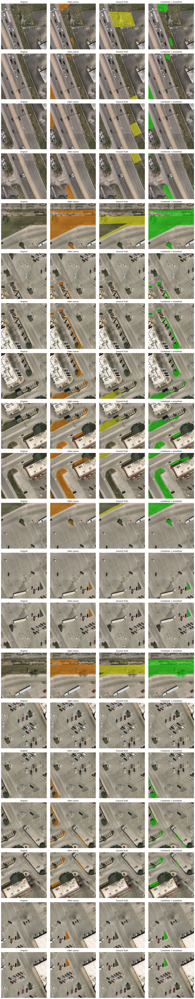

Mean IoU (combined, smoothed, 20 samples): 0.1729


In [15]:
def make_overlay(img, mask, color=(0, 1, 0), alpha=0.45):
    img_f = img.astype(np.float32) / 255.0
    overlay = img_f.copy()
    mask_bool = mask.astype(bool)
    for c in range(3):
        overlay[..., c] = np.where(mask_bool, img_f[..., c] * (1 - alpha) + color[c] * alpha, img_f[..., c])
    return overlay

def iou_np(pred_bool, target_bool, eps=1e-7):
    inter = (pred_bool & target_bool).sum()
    union = (pred_bool | target_bool).sum()
    return (inter + eps) / (union + eps)

N_SAMPLES = min(20, len(val_img_paths))
ious = []
fig, axes = plt.subplots(N_SAMPLES, 4, figsize=(18, 4.5 * N_SAMPLES))

for row in range(N_SAMPLES):
    img_path = val_img_paths[row]
    fname = os.path.basename(img_path)
    img_bgr = cv2.imread(img_path)
    gt_mask = cv2.imread(os.path.join(VAL_MASK_DIR, fname), cv2.IMREAD_GRAYSCALE)
    gt_bin = cv2.resize(gt_mask, (SAM_IMG_SIZE, SAM_IMG_SIZE), interpolation=cv2.INTER_NEAREST) > 127

    coarse, refined, smoothed = full_pipeline(img_bgr)
    ious.append(iou_np(smoothed, gt_bin))

    img_rs = cv2.resize(img_bgr, (SAM_IMG_SIZE, SAM_IMG_SIZE))[:, :, ::-1]
    axes[row, 0].imshow(img_rs); axes[row, 0].set_title("Original")
    axes[row, 1].imshow(make_overlay(img_rs, cv2.resize(coarse, (SAM_IMG_SIZE, SAM_IMG_SIZE)), color=(1,0.5,0)))
    axes[row, 1].set_title("UNet coarse")
    axes[row, 2].imshow(make_overlay(img_rs, gt_bin, color=(1,1,0))); axes[row, 2].set_title("Ground Truth")
    axes[row, 3].imshow(make_overlay(img_rs, smoothed, color=(0,1,0))); axes[row, 3].set_title("Combined + smoothed")
    for ax in axes[row]: ax.axis("off")

plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, "combined_results.png"), dpi=150)
plt.show()

import shutil
shutil.make_archive(os.path.join(BASE_DIR, "combined_results"), "zip", RESULTS_DIR)
print(f"Mean IoU (combined, smoothed, {N_SAMPLES} samples): {np.mean(ious):.4f}")